In [1]:
# First let's import the packages we will use in this project

import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)


In [2]:
# Read in the data

df = pd.read_csv('movies.csv')

In [3]:
# Lets look at Data

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
df.isnull().sum()

name           0
rating        77
genre          0
year           0
released       2
score          3
votes          3
director       0
writer         3
star           1
country        3
budget      2171
gross        189
company       17
runtime        4
dtype: int64

In [5]:
# We need to see if we have any missing data
# Let's loop through the data and see if there is anything missing

for col in df.columns:
    pct_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, pct_missing))

name - 0.0%
rating - 0.010041731872717789%
genre - 0.0%
year - 0.0%
released - 0.0002608242044861763%
score - 0.0003912363067292645%
votes - 0.0003912363067292645%
director - 0.0%
writer - 0.0003912363067292645%
star - 0.00013041210224308815%
country - 0.0003912363067292645%
budget - 0.2831246739697444%
gross - 0.02464788732394366%
company - 0.002217005738132499%
runtime - 0.0005216484089723526%


In [6]:
# now we need to fix this so that there are no null values 

df1 = df.fillna({
    'rating': 'Unknown',
    'released': 'Unknown',
    'score': df['score'].mean(),
    'votes': df['votes'].median(),
    'writer': 'Unknown',
    'star': 'Unknown',
    'country': 'Unknown',
    'budget': df['budget'].median(),
    'gross': df['gross'].median(),
    'company': 'Unknown',
    'runtime': df['runtime'].median()
})


In [7]:
# Lets see if null values are resolved
df1.isnull().sum()

name        0
rating      0
genre       0
year        0
released    0
score       0
votes       0
director    0
writer      0
star        0
country     0
budget      0
gross       0
company     0
runtime     0
dtype: int64

In [8]:
# Data Types for our columns
df1.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [9]:
# change data type of columns

df1['budget']= df1['budget'].astype('int64')

df1['gross']= df1['gross'].astype('int64')

In [10]:
df1.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object

In [11]:
df1.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0


In [12]:
# Create correct Year Column
# Extract year using regex and convert to Int64

df1['yearcorrect'] = df1['released'].str.extract(r'(\d{4})').astype('Int64')



In [13]:
df1.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [14]:
df1.sort_values(by=['gross'],inplace = False, ascending = False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3818,"Love, Honor and Obey",R,Comedy,2000,"February 9, 2001 (United States)",6.5,5200.0,Dominic Anciano,Dominic Anciano,Sadie Frost,United Kingdom,20500000,1400,British Broadcasting Corporation (BBC),103.0,2001
7625,The Untold Story,Unknown,Comedy,2019,"January 11, 2019 (United States)",5.7,320.0,Shane Stanley,Lee Stanley,Miko Hughes,United States,20500000,790,Visual Arts Entertainment,104.0,2019
7580,Run with the Hunted,Not Rated,Crime,2019,"June 26, 2020 (United States)",5.2,735.0,John Swab,John Swab,Ron Perlman,United States,20500000,682,Roxwell Films,93.0,2020
2417,Madadayo,Unknown,Drama,1993,"April 17, 1993 (Japan)",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0,1993


In [15]:
pd.set_option('display.max_rows',None)

In [16]:
# Drop any Duplicates

df1.drop_duplicates()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.400000,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.800000,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.700000,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.700000,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.300000,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980 (United States)",6.400000,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980 (United States)",7.900000,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980 (United States)",8.200000,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981 (United States)",6.800000,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980 (United States)",7.000000,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


In [17]:
df1.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


In [18]:
# Budget high correlation

# company high correlation

In [19]:
df = df1.sort_values(by=['gross'],inplace = False, ascending = False)

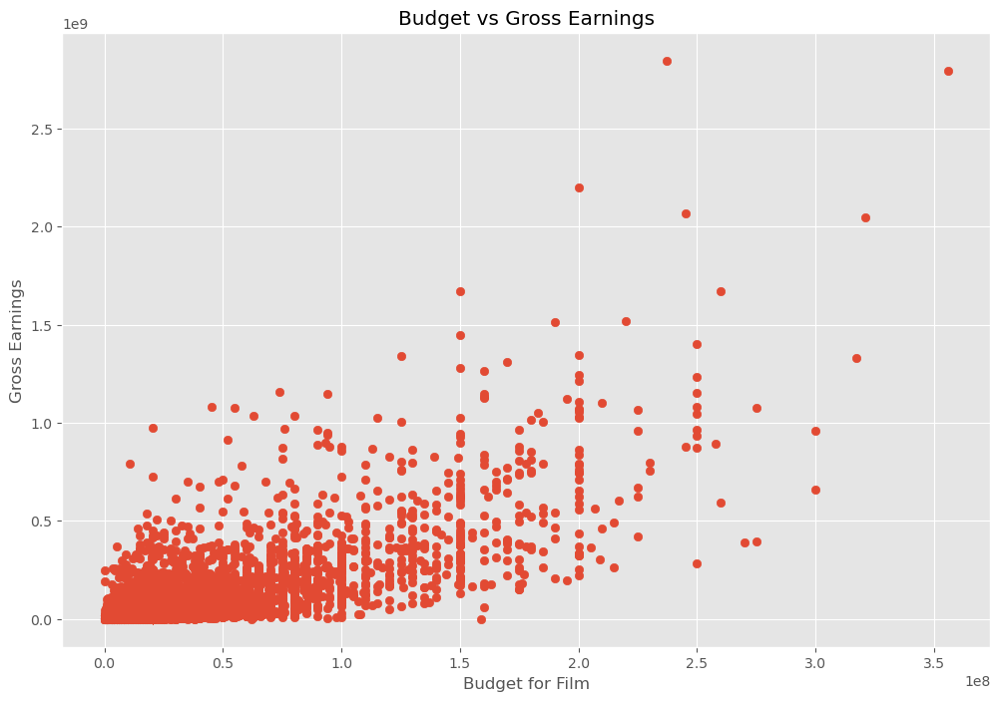

In [20]:
# ScatterPlot with budget vs gross

plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget vs Gross Earnings')

plt.xlabel('Budget for Film')
plt.ylabel('Gross Earnings')
            
plt.show()
                                  
                    



In [21]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


<Axes: xlabel='budget', ylabel='gross'>

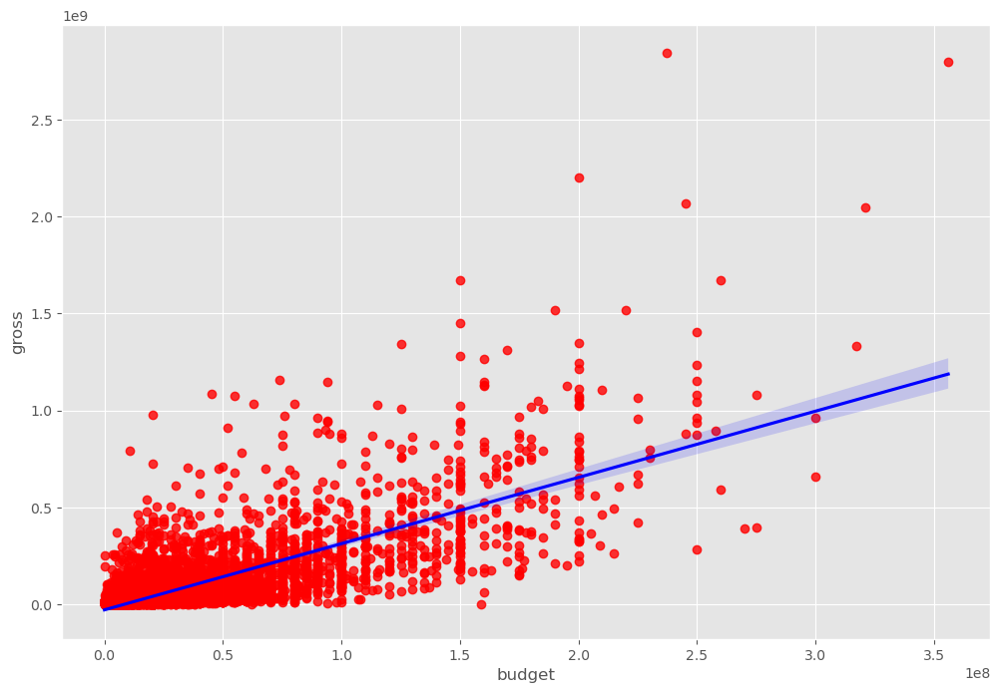

In [22]:
# Plot the budget vs gross using seaborn regplot

sns.regplot(x='budget', y = 'gross', data = df, scatter_kws={"color":"red"},line_kws={"color":"blue"})

In [23]:
# Lets start looking at correlation

# Correlation Matrix between all numeric columns

In [24]:
df.corr(method='pearson', numeric_only=True)


,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.097936,0.222573,0.291690,0.259504,0.120662,0.997415
score,0.097936,1.000000,0.409173,0.061970,0.185579,0.399400,0.105932
votes,0.222573,0.409173,1.000000,0.460968,0.632120,0.309151,0.218066
budget,0.291690,0.061970,0.460968,1.000000,0.745881,0.273371,0.284088
gross,0.259504,0.185579,0.632120,0.745881,1.000000,0.244380,0.252701
runtime,0.120662,0.399400,0.309151,0.273371,0.244380,1.000000,0.120540
yearcorrect,0.997415,0.105932,0.218066,0.284088,0.252701,0.120540,1.000000


In [25]:
df.corr(method ='kendall', numeric_only=True)

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.067518,0.331208,0.185818,0.196205,0.097157,0.987642
score,0.067518,1.000000,0.300084,-0.001665,0.084532,0.283423,0.073297
votes,0.331208,0.300084,1.000000,0.268941,0.530052,0.198120,0.325561
budget,0.185818,-0.001665,0.268941,1.000000,0.376115,0.192008,0.180256
gross,0.196205,0.084532,0.530052,0.376115,1.000000,0.165143,0.187082
runtime,0.097157,0.283423,0.198120,0.192008,0.165143,1.000000,0.096973
yearcorrect,0.987642,0.073297,0.325561,0.180256,0.187082,0.096973,1.000000


In [26]:
df.corr(method ='spearman', numeric_only=True)

,year,score,votes,budget,gross,runtime,yearcorrect
year,1.000000,0.098869,0.469557,0.258703,0.287788,0.142941,0.997407
score,0.098869,1.000000,0.428088,-0.002768,0.124000,0.399607,0.107421
votes,0.469557,0.428088,1.000000,0.381894,0.722490,0.289986,0.462498
budget,0.258703,-0.002768,0.381894,1.000000,0.520018,0.270410,0.250754
gross,0.287788,0.124000,0.722490,0.520018,1.000000,0.241429,0.274170
runtime,0.142941,0.399607,0.289986,0.270410,0.241429,1.000000,0.142885
yearcorrect,0.997407,0.107421,0.462498,0.250754,0.274170,0.142885,1.000000


In [34]:
# we saw that High correlation between budget and gross


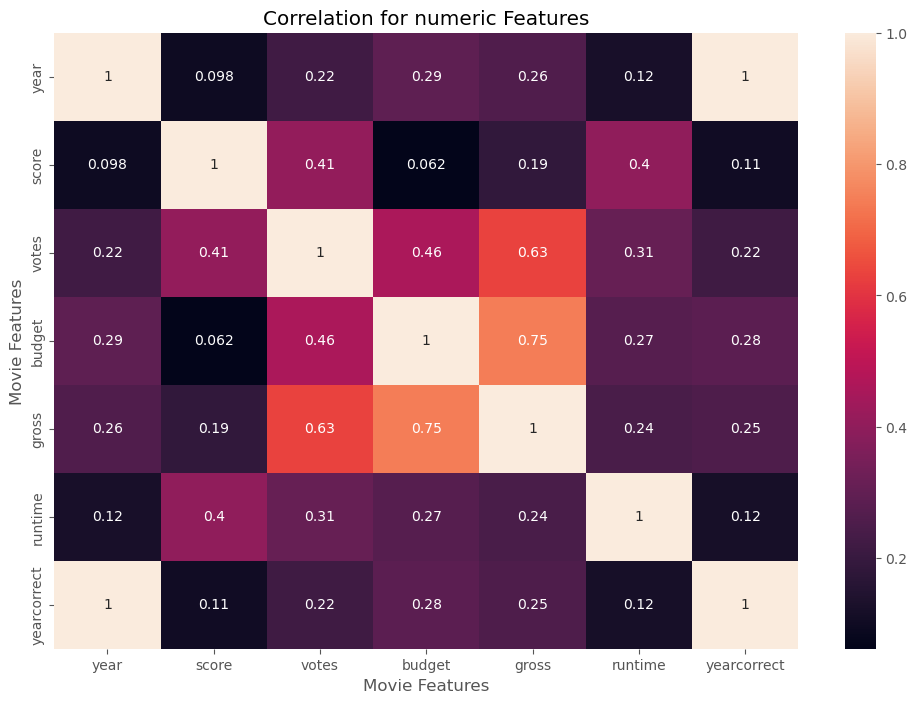

In [27]:
correlation_matrix = df.corr(method='pearson', numeric_only=True)

sns.heatmap(correlation_matrix, annot = True)

plt.title('Correlation for numeric Features')

plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [28]:
# Lets look at company

df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009 (United States)",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019 (United States)",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997 (United States)",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015 (United States)",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018 (United States)",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018


In [29]:
df_numerised = df

In [30]:
for col_name in df_numerised.columns:
    if(df_numerised[col_name].dtype == 'object'):
        df_numerised[col_name]= df_numerised[col_name].astype('category')
        df_numerised[col_name] = df_numerised[col_name].cat.codes
    
    
df_numerised

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
5445,533,5,0,2009,696,7.800000,1100000.0,1155,1778,2334,55,237000000,2847246203,2253,162.0,2009
7445,535,5,0,2019,183,8.400000,903000.0,162,743,2241,55,356000000,2797501328,1606,181.0,2019
3045,6896,5,6,1997,704,7.800000,1100000.0,1155,1778,1595,55,200000000,2201647264,2253,194.0,1997
6663,5144,5,0,2015,698,7.800000,876000.0,1125,2550,524,55,245000000,2069521700,1540,138.0,2015
7244,536,5,0,2018,192,8.400000,897000.0,162,743,2241,55,321000000,2048359754,1606,149.0,2018
7480,6194,4,2,2019,1488,6.900000,222000.0,1455,1919,676,55,260000000,1670727580,2317,118.0,2019
6653,2969,5,0,2015,1704,7.000000,593000.0,517,3568,437,55,150000000,1670516444,2281,124.0,2015
6043,5502,5,0,2012,2472,8.000000,1300000.0,1517,2314,2241,55,220000000,1518815515,1606,143.0,2012
6646,2145,5,0,2015,221,7.100000,370000.0,1189,706,2722,55,190000000,1515341399,2281,137.0,2015
7494,2131,4,2,2019,2676,6.800000,148000.0,432,1950,1527,55,150000000,1450026933,2316,103.0,2019


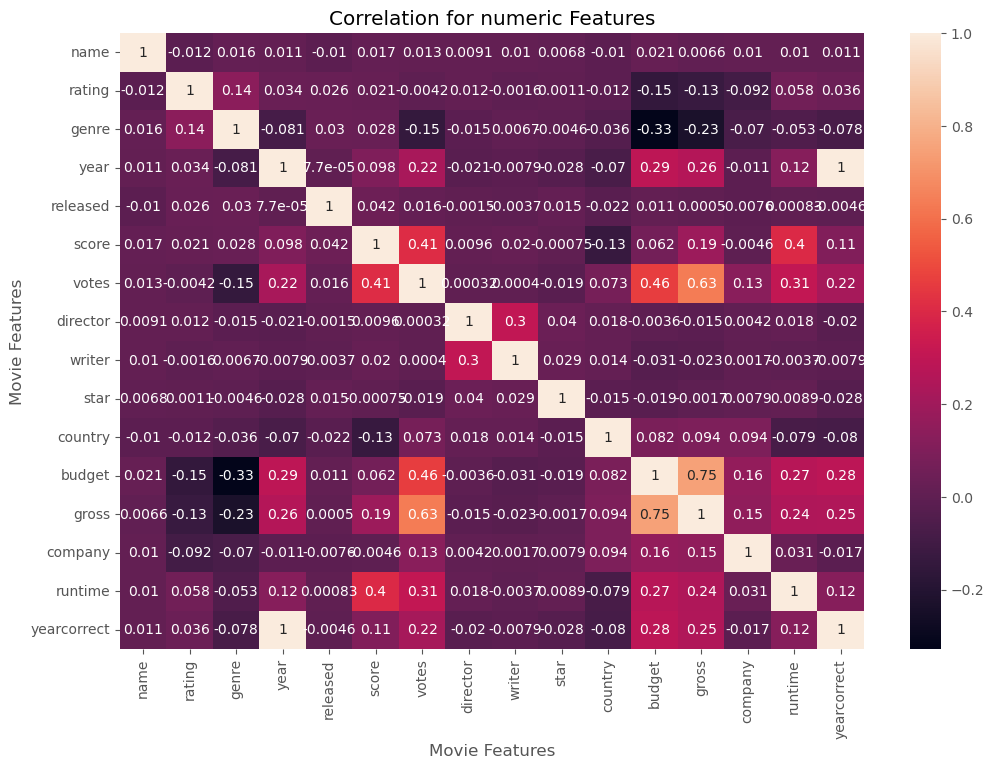

In [31]:
correlation_matrix = df_numerised.corr(method='pearson', numeric_only=True)

sns.heatmap(correlation_matrix, annot = True)

plt.title('Correlation for numeric Features')

plt.xlabel('Movie Features')
plt.ylabel('Movie Features')

plt.show()

In [32]:
df_numerised.corr()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,yearcorrect
name,1.000000,-0.012206,0.016355,0.011453,-0.010480,0.017095,0.013056,0.009079,0.009985,0.006844,-0.010359,0.020921,0.006601,0.010373,0.010335,0.010699
rating,-0.012206,1.000000,0.136127,0.033801,0.025526,0.020968,-0.004217,0.011951,-0.001610,0.001063,-0.011793,-0.149686,-0.130747,-0.092284,0.058023,0.035663
genre,0.016355,0.136127,1.000000,-0.081261,0.030429,0.027959,-0.145291,-0.015258,0.006747,-0.004641,-0.035783,-0.328484,-0.233385,-0.070032,-0.052719,-0.077911
year,0.011453,0.033801,-0.081261,1.000000,0.000077,0.097936,0.222573,-0.020795,-0.007930,-0.027912,-0.069590,0.291690,0.259504,-0.011425,0.120662,0.997415
released,-0.010480,0.025526,0.030429,0.000077,1.000000,0.042140,0.016016,-0.001526,-0.003707,0.015474,-0.021707,0.010848,0.000495,-0.007634,0.000832,-0.004644
score,0.017095,0.020968,0.027959,0.097936,0.042140,1.000000,0.409173,0.009559,0.019787,-0.000754,-0.134447,0.061970,0.185579,-0.004584,0.399400,0.105932
votes,0.013056,-0.004217,-0.145291,0.222573,0.016016,0.409173,1.000000,0.000316,0.000399,-0.019429,0.073461,0.460968,0.632120,0.130583,0.309151,0.218066
director,0.009079,0.011951,-0.015258,-0.020795,-0.001526,0.009559,0.000316,1.000000,0.299523,0.039875,0.018014,-0.003584,-0.014758,0.004248,0.017611,-0.020422
writer,0.009985,-0.001610,0.006747,-0.007930,-0.003707,0.019787,0.000399,0.299523,1.000000,0.028887,0.014490,-0.031041,-0.023034,0.001729,-0.003709,-0.007873
star,0.006844,0.001063,-0.004641,-0.027912,0.015474,-0.000754,-0.019429,0.039875,0.028887,1.000000,-0.015101,-0.018902,-0.001675,0.007918,0.008937,-0.028290


In [51]:
correlation_mat = df_numerised.corr()

corr_pairs = correlation_mat.unstack()

corr_pairs

name         name           1.000000
             rating        -0.012206
             genre          0.016355
             year           0.011453
             released      -0.010480
             score          0.017095
             votes          0.013056
             director       0.009079
             writer         0.009985
             star           0.006844
             country       -0.010359
             budget         0.020921
             gross          0.006601
             company        0.010373
             runtime        0.010335
             yearcorrect    0.010699
rating       name          -0.012206
             rating         1.000000
             genre          0.136127
             year           0.033801
             released       0.025526
             score          0.020968
             votes         -0.004217
             director       0.011951
             writer        -0.001610
             star           0.001063
             country       -0.011793
 

In [52]:
sorted_pairs = corr_pairs.sort_values()

sorted_pairs

genre        budget        -0.328484
budget       genre         -0.328484
genre        gross         -0.233385
gross        genre         -0.233385
rating       budget        -0.149686
budget       rating        -0.149686
votes        genre         -0.145291
genre        votes         -0.145291
country      score         -0.134447
score        country       -0.134447
gross        rating        -0.130747
rating       gross         -0.130747
             company       -0.092284
company      rating        -0.092284
year         genre         -0.081261
genre        year          -0.081261
yearcorrect  country       -0.080269
country      yearcorrect   -0.080269
runtime      country       -0.079230
country      runtime       -0.079230
yearcorrect  genre         -0.077911
genre        yearcorrect   -0.077911
company      genre         -0.070032
genre        company       -0.070032
country      year          -0.069590
year         country       -0.069590
genre        runtime       -0.052719
r

In [50]:
pd.set_option('display.max_rows', None)

In [53]:
high_corr = sorted_pairs[(sorted_pairs)>0.5]
high_corr

votes        gross          0.632120
gross        votes          0.632120
budget       gross          0.745881
gross        budget         0.745881
yearcorrect  year           0.997415
year         yearcorrect    0.997415
name         name           1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
writer       writer         1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
rating       rating         1.000000
runtime      runtime        1.000000
yearcorrect  yearcorrect    1.000000
dtype: float64

In [54]:
# Votes and Budget has the highest correlation to gross earnings

# Company has low correlation

# Hence, our assumption of company correlated to gross was wrong